In [ ]:
!pip install -q torch torchvision torchaudio


In [ ]:
!pip install -q 'git+https://github.com/facebookresearch/detectron2.git'


  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.2/85.2 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 58.6 MB/s eta 0:00:00


In [ ]:
import detectron2
print("Detectron2 versión:", detectron2.__version__)


Detectron2 versión: 0.6


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os

BASE_DIR   = "/content/drive/MyDrive/PROYECTO_CASAS"
IMG_DIR    = os.path.join(BASE_DIR, "images")
COCO_JSON  = os.path.join(BASE_DIR, "coco_casas_train.json")

print("JSON existe:", os.path.exists(COCO_JSON))
print("Imágenes (primeros 5):", os.listdir(IMG_DIR)[:5])


JSON existe: True
Imágenes (primeros 5): ['rio_tambo_006.tif', 'rio_tambo_010.tif', 'rio_tambo_011.tif', 'rio_tambo_009.tif', 'iparia_ucayali_07.tif']


In [ ]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances(
    "casas_train",
    {},
    COCO_JSON,
    IMG_DIR
)

print("✅ Dataset registrado")


✅ Dataset registrado


In [ ]:
from detectron2.config import get_cfg
from detectron2 import model_zoo

cfg = get_cfg()
cfg.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    )
)

cfg.DATASETS.TRAIN = ("casas_train",)
cfg.DATASETS.TEST  = ()

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
)

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 500

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1


In [ ]:
from detectron2.engine import DefaultTrainer

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()


[11/20 15:16:05 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
model_final_f10217.pkl: 178MB [00:00, 249MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[11/20 15:16:06 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.12/dist-packages/torch/functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4322.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/20 15:16:23 d2.utils.events]:  eta: 0:04:19  iter: 19  total_loss: 4.145  loss_cls: 0.7637  loss_box_reg: 0.07107  loss_mask: 0.6956  loss_rpn_cls: 1.804  loss_rpn_loc: 0.7561    time: 0.5758  last_time: 0.3885  data_time: 0.1917  last_data_time: 0.0016   lr: 9.7405e-06  max_mem: 1908M
[11/20 15:16:40 d2.utils.events]:  eta: 0:03:19  iter: 39  total_loss: 2.215  loss_cls: 0.6558  loss_box_reg: 0.1126  loss_mask: 0.69  loss_rpn_cls: 0.2053  loss_rpn_loc: 0.539    time: 0.5255  last_time: 0.3426  data_time: 0.0923  last_data_time: 0.0011   lr: 1.9731e-05  max_mem: 1908M
[11/20 15:16:49 d2.utils.events]:  eta: 0:03:10  iter: 59  total_loss: 1.879  loss_cls: 0.4533  loss_box_reg: 0.1029  loss_mask: 0.6782  loss_rpn_cls: 0.1877  loss_rpn_loc: 0.4653    time: 0.4968  last_time: 0.3654  data_time: 0.0260  last_data_time: 0.0039   lr: 2.972e-05  max_mem: 1908M
[11/20 15:16:59 d2.utils.events]:  eta: 0:03:02  iter: 79  total_loss: 1.744  loss_cls: 0.3127  loss_box_reg: 0.1083  loss_mask: 0.

In [ ]:
import os
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog
import cv2
import matplotlib.pyplot as plt

# Asegúrate que cfg es el mismo que usaste al entrenar
print("OUTPUT_DIR:", cfg.OUTPUT_DIR)
print("Archivos en OUTPUT_DIR:", os.listdir(cfg.OUTPUT_DIR))

# Usar el modelo final entrenado
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # umbral de confianza

predictor = DefaultPredictor(cfg)
metadata = MetadataCatalog.get("casas_train")


OUTPUT_DIR: ./output
Archivos en OUTPUT_DIR: ['model_final.pth', 'events.out.tfevents.1763651791.f19006692ccd.184.0', 'metrics.json', 'last_checkpoint']
[11/20 15:24:51 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


Casas detectadas (todas): 13


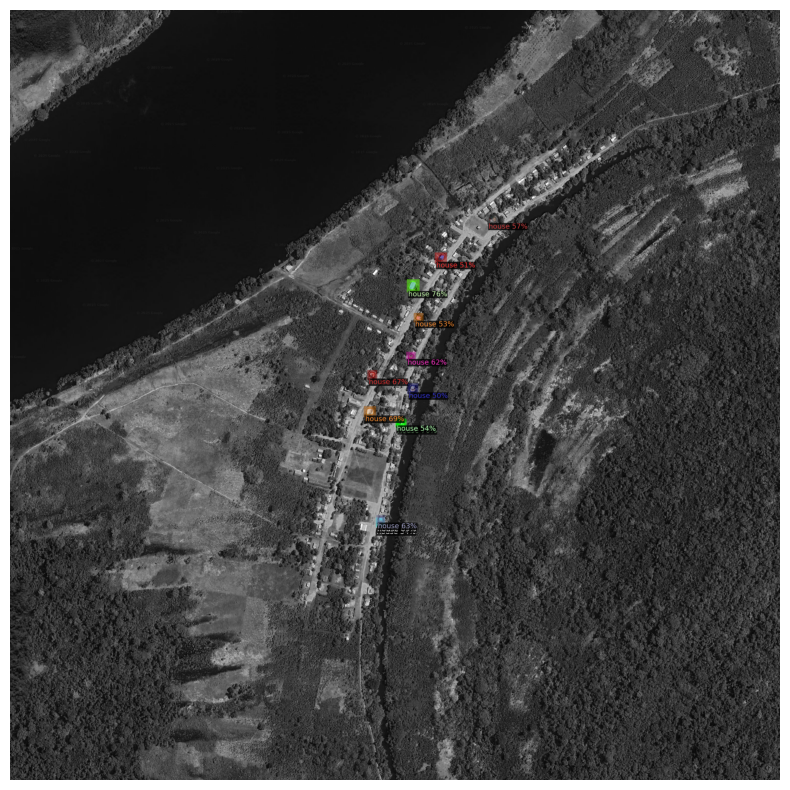

In [ ]:
import numpy as np

test_img_name = "iparia_ucayali_10.tif"  # cambia por la que quieras
test_img_path = os.path.join(IMG_DIR, test_img_name)

img = cv2.imread(test_img_path)              # BGR
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

outputs = predictor(img)  # predicciones
instances = outputs["instances"].to("cpu")

print("Casas detectadas (todas):", len(instances))

v = Visualizer(img_rgb, metadata=metadata, scale=1.0, instance_mode=ColorMode.IMAGE_BW)
out = v.draw_instance_predictions(instances)

plt.figure(figsize=(10,10))
plt.imshow(out.get_image())
plt.axis("off")
plt.show()


CONTAR CASAS DENTRO DE UN POLIGONO DE CCPP

In [ ]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 57.9 MB/s eta 0:00:00


In [ ]:
import geopandas as gpd
from shapely.geometry import Point
import rasterio

# 1) Abrir el GeoTIFF para obtener el transform
with rasterio.open(test_img_path) as src:
    transform = src.transform
    crs_raster = src.crs

print("Transform:", transform)
print("CRS raster:", crs_raster)

# 2) Leer capa de CCPP
CCPP_GPKG = os.path.join(BASE_DIR, "capa_unida.gpkg")  # <-- AJUSTA NOMBRE
LAYER_CCPP = None  # o "nombre_de_la_capa" si hay varias

if LAYER_CCPP is None:
    gdf_ccpp = gpd.read_file(CCPP_GPKG)
else:
    gdf_ccpp = gpd.read_file(CCPP_GPKG, layer=LAYER_CCPP)

print(gdf_ccpp.columns)
print(gdf_ccpp.head())


Transform: | 0.70, 0.00, 569012.04|
| 0.00,-0.70, 8977638.01|
| 0.00, 0.00, 1.00|
CRS raster: EPSG:32718
Index(['id_img', 'imagen', 'id_casa', 'geometry'], dtype='object')
              id_img             imagen  id_casa  \
0  iparia_ucayali_10  iparia_ucayali_10        1   
1  iparia_ucayali_10  iparia_ucayali_10        2   
2  iparia_ucayali_10  iparia_ucayali_10        3   
3  iparia_ucayali_10  iparia_ucayali_10        4   
4  iparia_ucayali_10  iparia_ucayali_10        5   

                                            geometry  
0  POLYGON ((569795.391 8976176.711, 569802.121 8...  
1  POLYGON ((569802.854 8976240.983, 569806.444 8...  
2  POLYGON ((569697.535 8976266.116, 569700.647 8...  
3  POLYGON ((569799.733 8976290.04, 569803.424 89...  
4  POLYGON ((569702.323 8976297.472, 569705.913 8...  


In [ ]:
#GUARDAR EL MODELO
import os, shutil

SRC = "./output"
DST = "/content/drive/MyDrive/PROYECTO_CASAS/output_maskrcnn"

shutil.copytree(SRC, DST, dirs_exist_ok=True)
print("Copiado a:", DST, "→", os.listdir(DST))


Copiado a: /content/drive/MyDrive/PROYECTO_CASAS/output_maskrcnn → ['model_final.pth', 'events.out.tfevents.1763651791.f19006692ccd.184.0', 'metrics.json', 'last_checkpoint']


1. CONVERTIR CENTROS DE CAJAS A COORDENADAS GEOFRAFICAS Y CONTAR

In [ ]:
#LEET CCPP Y PONER DENTRO DEL MISMO CRS
import geopandas as gpd
import os

BASE_DIR = "/content/drive/MyDrive/PROYECTO_CASAS"

# Archivo que con los CCPP
CCPP_GPKG = os.path.join(BASE_DIR, "poligonos_total.gpkg")

# Leer capa de CCPP (tiene IDCCPP_17 y NOMCCPP_17)
gdf_ccpp = gpd.read_file(CCPP_GPKG)

print("CRS CCPP:", gdf_ccpp.crs)
print("Campos CCPP:", gdf_ccpp.columns)

# Asegurar mismo CRS para casas y CCPP
gdf_pred = gdf_pred.to_crs(gdf_ccpp.crs)


CRS CCPP: EPSG:32718
Campos CCPP: Index(['IDCCPP_17', 'NOMCCPP_17', 'AREA_17', 'DELIMITADO', 'POSIBILIDAD',
       'OBSERVACIONES', 'layer', 'path', 'imagen', 'geometry'],
      dtype='object')


In [ ]:
#Asignar a cada casa el CCPP en el q cae -join espacial-
from geopandas import sjoin

CAMPO_ID_CCPP   = "IDCCPP_17"
CAMPO_NOM_CCPP  = "NOMCCPP_17"

gdf_join = sjoin(
    gdf_pred,
    gdf_ccpp[[CAMPO_ID_CCPP, CAMPO_NOM_CCPP, "geometry"]],
    how="left",
    predicate="within"  # punto dentro del polígono
)

print("Campos después del join:", gdf_join.columns)
print(gdf_join.head())


Campos después del join: Index(['id_img', 'score', 'geometry', 'index_right', 'IDCCPP_17',
       'NOMCCPP_17'],
      dtype='object')
          id_img     score                        geometry  index_right  \
0  rio_tambo_006  0.813929  POINT (639017.376 8793659.363)          9.0   
1  rio_tambo_006  0.669790  POINT (639086.071 8793703.017)          9.0   
2  rio_tambo_006  0.622524   POINT (638792.349 8793680.34)          9.0   
3  rio_tambo_006  0.601986  POINT (639364.702 8793808.417)          9.0   
4  rio_tambo_006  0.575358  POINT (639134.108 8793735.959)          9.0   

    IDCCPP_17                   NOMCCPP_17  
0  1206080010  SANTA ROSITA DE SHIRINTIARI  
1  1206080010  SANTA ROSITA DE SHIRINTIARI  
2  1206080010  SANTA ROSITA DE SHIRINTIARI  
3  1206080010  SANTA ROSITA DE SHIRINTIARI  
4  1206080010  SANTA ROSITA DE SHIRINTIARI  


In [ ]:
# Quitar casas que no caen en ningún CCPP
gdf_join_valid = gdf_join.dropna(subset=[CAMPO_ID_CCPP])

# Conteo de casas por CCPP
counts = (
    gdf_join_valid
    .groupby([CAMPO_ID_CCPP, CAMPO_NOM_CCPP])
    .size()
    .reset_index(name="n_casas_pred")
)

print("Ejemplo de conteos:")
print(counts.head())

# Unir conteos a la capa de CCPP
gdf_ccpp_counts = gdf_ccpp.merge(
    counts,
    on=[CAMPO_ID_CCPP, CAMPO_NOM_CCPP],
    how="left"
)

gdf_ccpp_counts["n_casas_pred"] = (
    gdf_ccpp_counts["n_casas_pred"].fillna(0).astype(int)
)

total_ccpp   = len(gdf_ccpp_counts)
total_casas  = int(gdf_ccpp_counts["n_casas_pred"].sum())

print("Total CCPP (polígonos):", total_ccpp)
print("Total casas detectadas dentro de CCPP:", total_casas)


Ejemplo de conteos:
    IDCCPP_17                   NOMCCPP_17  n_casas_pred
0  1203020063                 CHURINGAVENI            39
1  1203020076                  SHINTORIATO            27
2  1203020078                 SHANKIVIRONI            35
3  1206080010  SANTA ROSITA DE SHIRINTIARI            39
4  1206080034                      SHEVOJA            83
Total CCPP (polígonos): 75
Total casas detectadas dentro de CCPP: 2237


exportar a qgis casas detectadas -puntos+ccpp+score

In [ ]:
casas_out = os.path.join(BASE_DIR, "casas_detectadas.gpkg")
gdf_join.to_file(casas_out, layer="casas_pred", driver="GPKG")
print("Guardado:", casas_out)


Guardado: /content/drive/MyDrive/PROYECTO_CASAS/casas_detectadas.gpkg


ccpp con numero de casas

In [ ]:
ccpp_out = os.path.join(BASE_DIR, "ccpp_con_casas.gpkg")
gdf_ccpp_counts.to_file(ccpp_out, layer="ccpp_casas", driver="GPKG")
print("Guardado:", ccpp_out)


Guardado: /content/drive/MyDrive/PROYECTO_CASAS/ccpp_con_casas.gpkg


Total imágenes: 72
Ejemplos: ['rio_tambo_006.tif', 'rio_tambo_010.tif', 'rio_tambo_011.tif', 'rio_tambo_009.tif', 'iparia_ucayali_07.tif', 'iparia_ucayali_08.tif', 'iparia_ucayali_09.tif', 'iparia_ucayali_10.tif', 'iparia_ucayali_11.tif', 'perene_junin_03.tif']

Imagen: ucayali_007.tif
Casas detectadas: 29


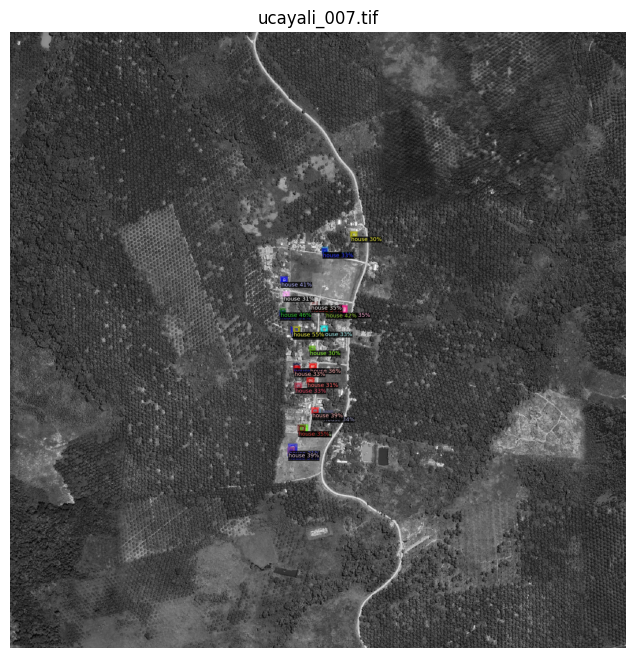


Imagen: ucayali_058.tif
Casas detectadas: 19


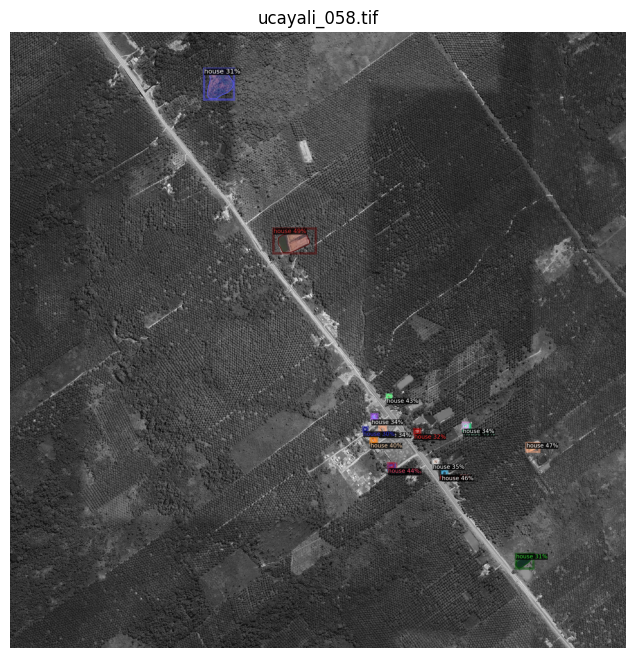


Imagen: iparia_ucayali_08.tif
Casas detectadas: 47


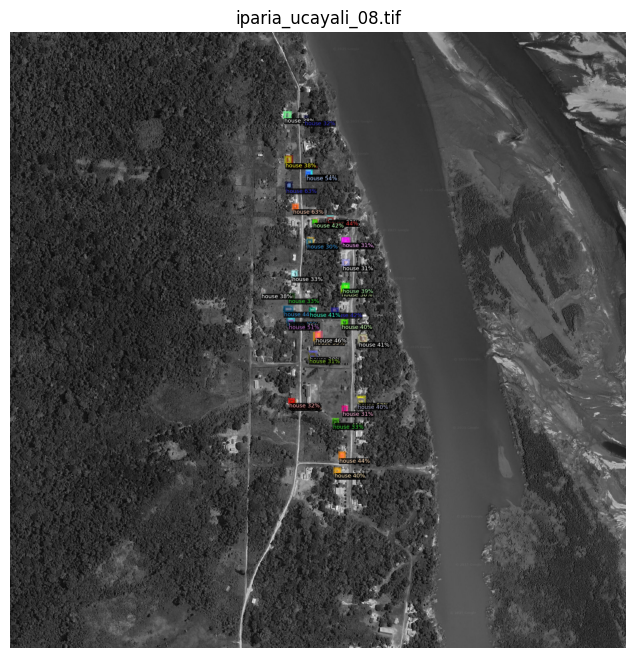


Imagen: ucayali_039.tif
Casas detectadas: 2


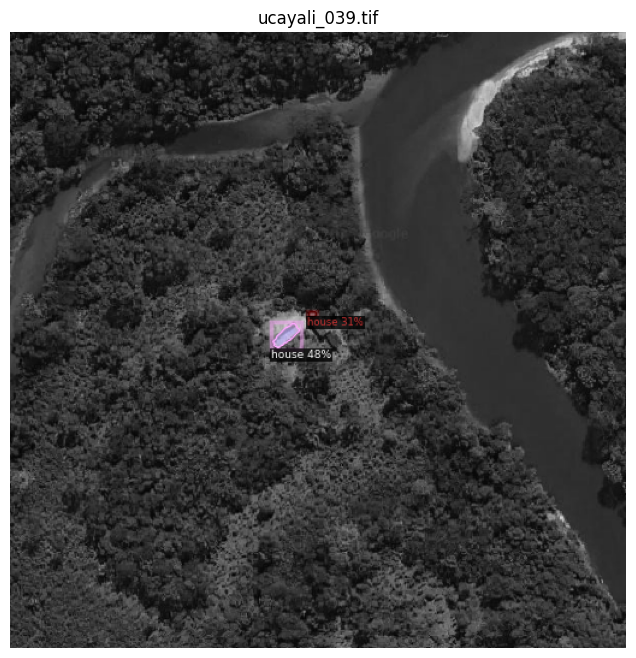

In [ ]:
import os, random, cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog

metadata = MetadataCatalog.get("casas_train")

# lista de imágenes disponibles
all_imgs = [f for f in os.listdir(IMG_DIR) if f.lower().endswith(".tif")]
print("Total imágenes:", len(all_imgs))
print("Ejemplos:", all_imgs[:10])

# elige 4 al azar (puedes cambiar el número)
sample_imgs = random.sample(all_imgs, 4)

for fname in sample_imgs:
    print("\nImagen:", fname)
    img_path = os.path.join(IMG_DIR, fname)

    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    outputs = predictor(img)
    instances = outputs["instances"].to("cpu")
    print("Casas detectadas:", len(instances))

    v = Visualizer(
        img_rgb,
        metadata=metadata,
        scale=1.0,
        instance_mode=ColorMode.IMAGE_BW
    )
    out = v.draw_instance_predictions(instances)

    plt.figure(figsize=(8,8))
    plt.imshow(out.get_image())
    plt.title(fname)
    plt.axis("off")
    plt.show()


prediccion sobre nuevos tiles sin considerar poligonos

In [ ]:
TEST_DIR = "/content/drive/MyDrive/PROYECTO_CASAS/images_test"

test_imgs = [f for f in os.listdir(TEST_DIR) if f.endswith(".tif")]
print("Imágenes nuevas:", len(test_imgs))

for fname in test_imgs[:5]:
    img_path = os.path.join(TEST_DIR, fname)
    img = cv2.imread(img_path)

    outputs = predictor(img)
    inst = outputs["instances"].to("cpu")
    print(fname, "→ casas detectadas:", len(inst))

Imágenes nuevas: 7
rio_tambo_005.tif → casas detectadas: 24
rio_tambo_007.tif → casas detectadas: 38
rio_tambo_008.tif → casas detectadas: 41
rio_tambo_003.tif → casas detectadas: 12
rio_tambo_004.tif → casas detectadas: 30


Imágenes nuevas: ['rio_tambo_005.tif', 'rio_tambo_007.tif', 'rio_tambo_008.tif', 'rio_tambo_003.tif', 'rio_tambo_004.tif', 'rio_tambo_001.tif', 'rio_tambo_002.tif']
rio_tambo_005.tif → casas detectadas: 24


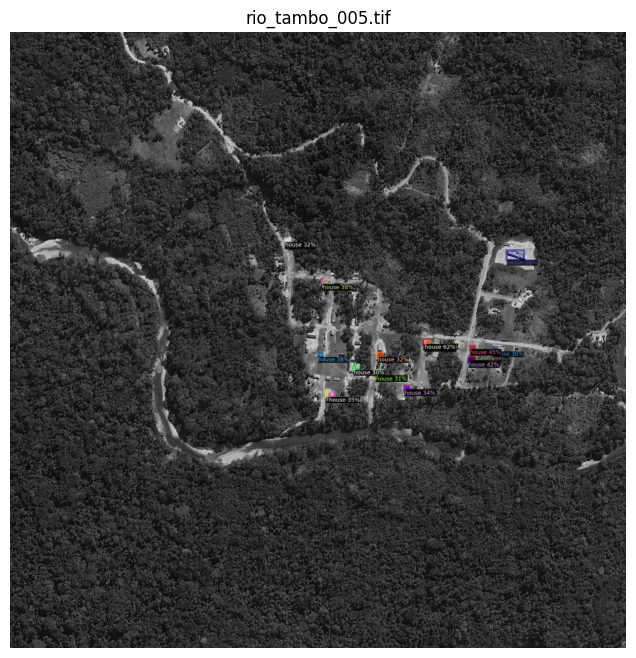

rio_tambo_007.tif → casas detectadas: 38


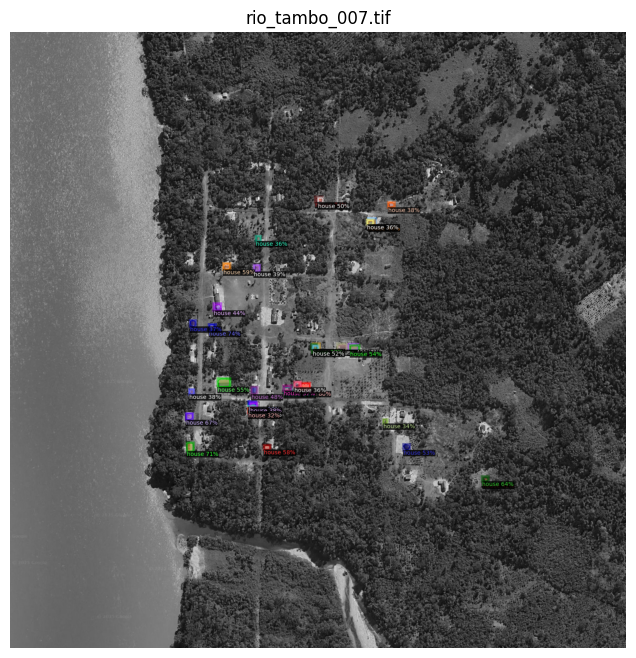

rio_tambo_008.tif → casas detectadas: 41


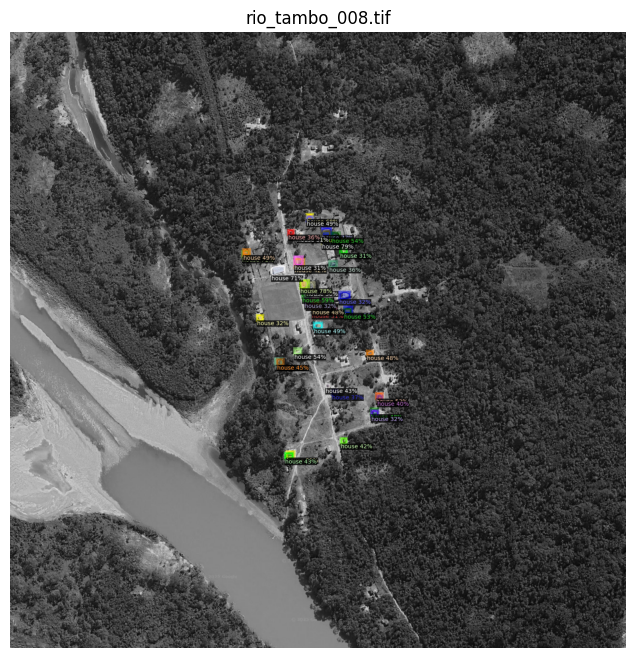

rio_tambo_003.tif → casas detectadas: 12


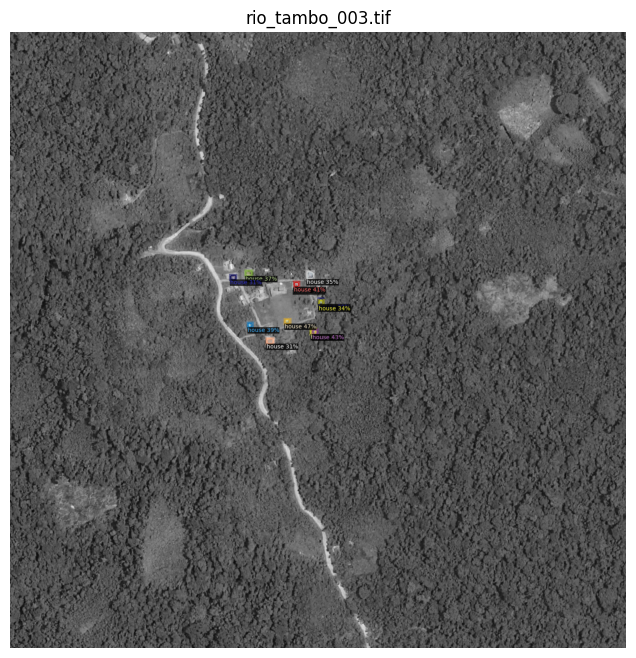

rio_tambo_004.tif → casas detectadas: 30


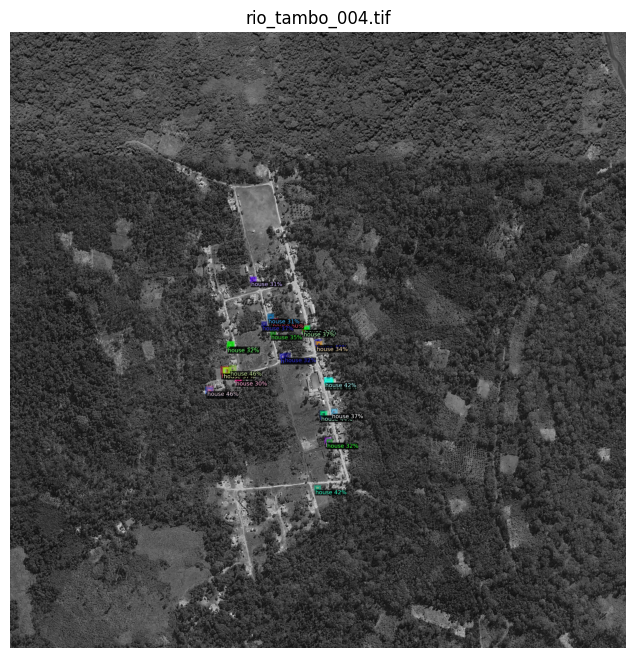

rio_tambo_001.tif → casas detectadas: 26


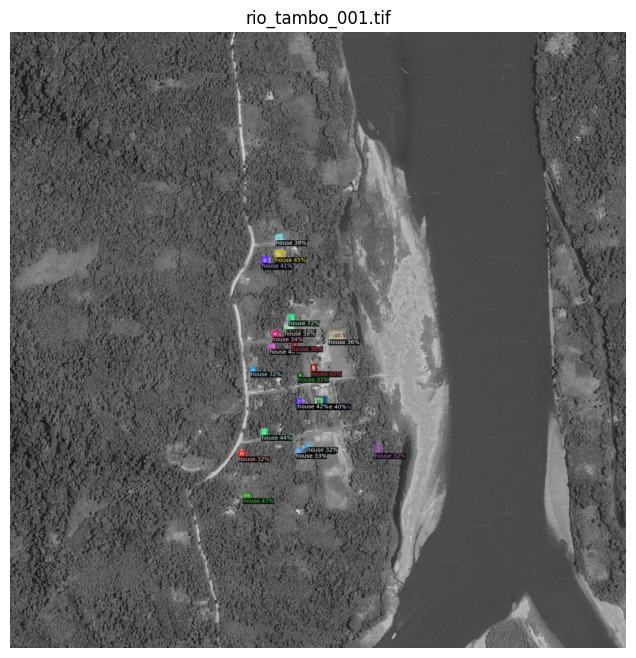

rio_tambo_002.tif → casas detectadas: 11


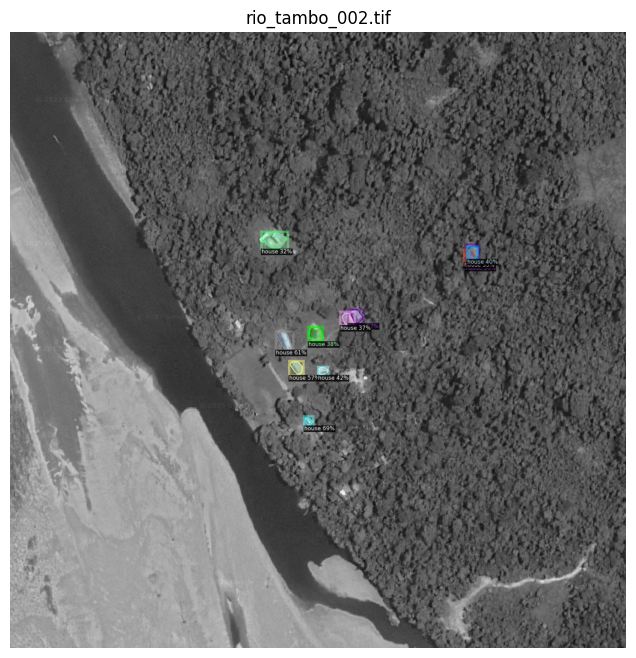

In [ ]:
import os, cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog

TEST_DIR = "/content/drive/MyDrive/PROYECTO_CASAS/images_test"

# reutilizamos las mismas imágenes
test_imgs = [f for f in os.listdir(TEST_DIR) if f.lower().endswith(".tif")]
print("Imágenes nuevas:", test_imgs)

# usamos el mismo metadata del train
metadata = MetadataCatalog.get("casas_train")

for fname in test_imgs:   # si quieres menos, pon test_imgs[:3]
    img_path = os.path.join(TEST_DIR, fname)
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    outputs = predictor(img)
    instances = outputs["instances"].to("cpu")
    print(fname, "→ casas detectadas:", len(instances))

    v = Visualizer(
        img_rgb,
        metadata=metadata,
        scale=1.0,
        instance_mode=ColorMode.IMAGE_BW
    )
    out = v.draw_instance_predictions(instances)

    plt.figure(figsize=(8,8))
    plt.imshow(out.get_image())
    plt.title(fname)
    plt.axis("off")
    plt.show()


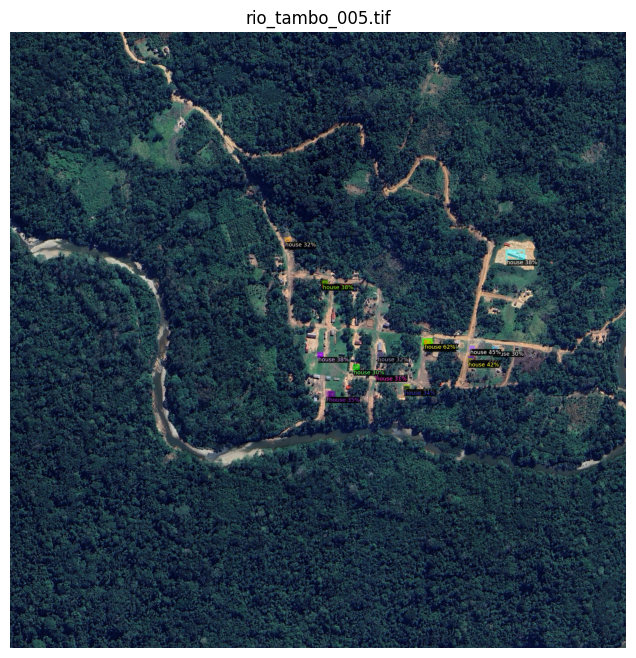

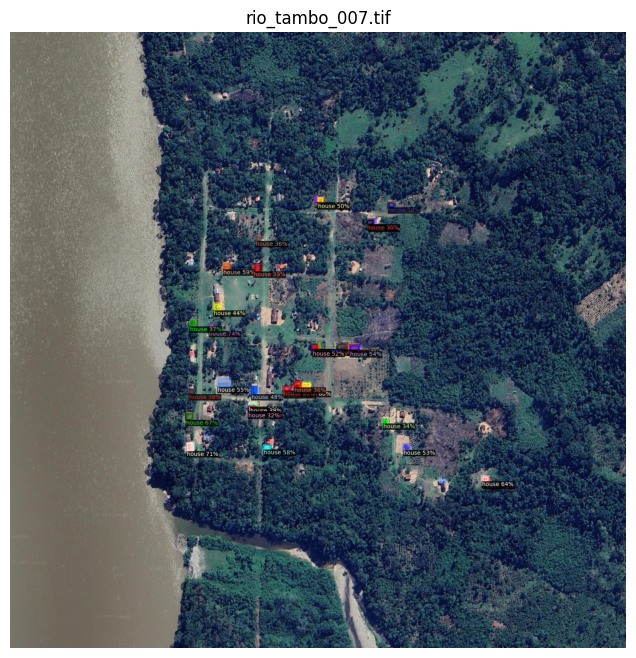

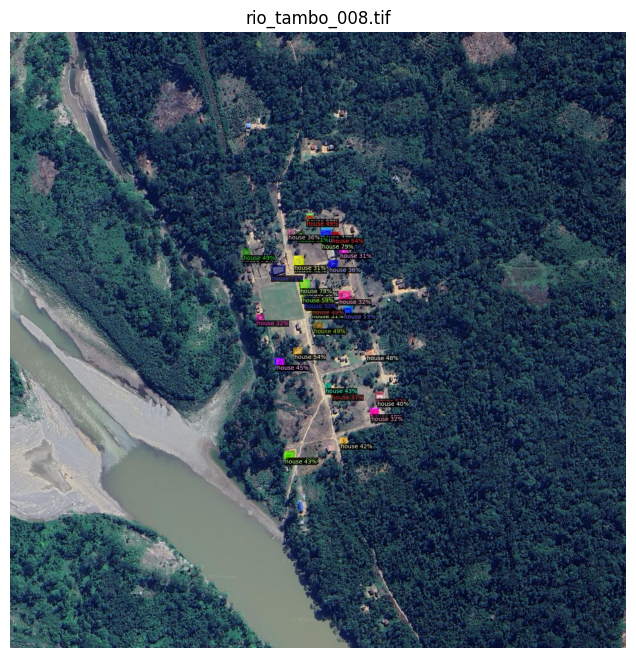

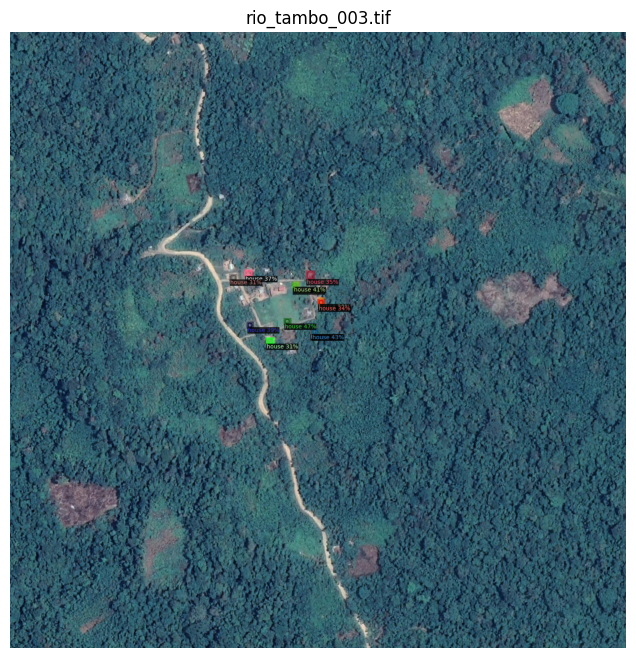

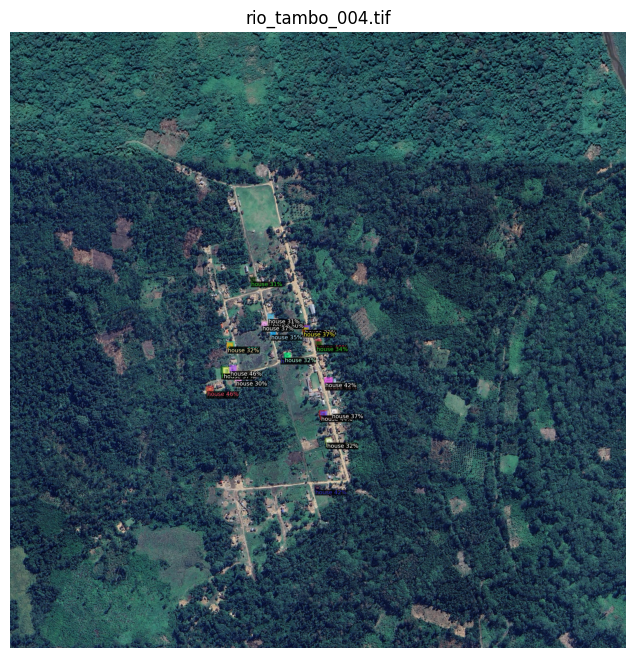

In [ ]:
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
import cv2

metadata = MetadataCatalog.get("casas_train")

TEST_DIR = "/content/drive/MyDrive/PROYECTO_CASAS/images_test"

for fname in test_imgs[:5]:   # Muestra solo 5 imágenes
    img_path = os.path.join(TEST_DIR, fname)

    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    outputs = predictor(img)

    v = Visualizer(img_rgb, metadata=metadata, scale=1.0)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    plt.figure(figsize=(8,8))
    plt.title(fname)
    plt.imshow(out.get_image())
    plt.axis("off")
    plt.show()
